Grab & Label Images with OSM labels
===================================

NOW NOW NOW NOW 

## Setup
Setup shit and imports here  
File directories etc

In [1]:
# Setup
import pandas as pd
import numpy as np
import datetime as dt

import glob
import os
import itertools
import collections
import re
import json
import requests
from shutil import copyfile
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import colour

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# https://matplotlib.org/3.1.0/tutorials/colors/colormap-manipulation.html

from shapely.geometry import Polygon, Point
import geopandas as gpd
import pyproj
import folium
from folium import Rectangle
from folium import Polygon as f_Polygon
import affine

from tqdm import tqdm # Progress bar stuff cos progress bars are good
tqdm.pandas() # now can use progress_apply instead of apply

import pickle # Pickle stuff, cos pickling is good

# Styles
pd.set_option('display.float_format', lambda x: '%.2f' % x) # pandas
np.set_printoptions(precision=5, suppress=True) # numpy

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

# seaborn plotting style
sns.set(style='ticks', context='poster')

import rasterio
from rasterio.crs import CRS
from rasterio.plot import show
from rasterio.warp import transform_bounds
from rasterio.features import geometry_mask

from shapely.ops import transform
from functools import partial
import pyproj

import matplotlib.ticker as mtick

# Charts
def hide_splines(ax):
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    
def add_value_labels(ax, spacing=5):
    """Add labels to the end of each bar in a bar chart.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        spacing (int): The distance between the labels and the bars.
    """

    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:,.0f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va,                      # Vertically align label differently for +ve and -ve values
            fontsize=16)                # Set fontsize  

### Utilities

In [2]:
### Utilities
def bng(df):
    # Takes dataframe or geodataframe and converts it to a geodataframe with CRS in British National Grid
    if type(df) != gpd.GeoDataFrame:
        df = gpd.GeoDataFrame(df, crs={'init':'epsg:27700'})
    elif type(df) == gpd.GeoDataFrame:
        df = df.to_crs(crs={'init':'epsg:27700'})
    return df

def wgs(df):
    # Takes dataframe or geodataframe and converts it to a geodataframe with CRS in WGS84
    if type(df) != gpd.GeoDataFrame:
        df = gpd.GeoDataFrame(df, crs={'init':'epsg:4326'})
    elif type(df) == gpd.GeoDataFrame:
        df = df.to_crs(crs={'init':'epsg:4326'})
    return df

In [3]:
# Transform shapely polygons
def poly_to_bng(poly):
    project = partial(
        pyproj.transform,
        pyproj.Proj(init='epsg:4326'),
        pyproj.Proj(init='epsg:27700'))
    return transform(project, poly)

def poly_to_wgs(poly):
    project = partial(
        pyproj.transform,
        pyproj.Proj(init='epsg:27700'),
        pyproj.Proj(init='epsg:4326'))
    return transform(project, poly)

In [4]:
# Mapping outlines
gb_outline = gpd.read_file('../../Data/shapefiles/Download_UK+boundaries_1183810/gb-outlines_2856975/greatbritain.shp')
towns = bng(gpd.read_file('../../Data/shapefiles/Major_Towns_and_Cities_December_2015_Boundaries_V2.geojson'))

In [5]:
# Raise error if CRS is not BNG
def check_bng(df):
    # Check if GeoDataFrame has CRS of BNG
    assert (df.crs == {'init': 'epsg:27700'}), 'CRS is not BNG'
    print(f'CRS of GeoDataFrame is BNG / epsg:27700')

In [6]:
def plot_uk(df):
    # Check a GeoDataFrame is in the UK somewhere. Expects dataframe in CRS BNG
    check_bng(df)
    fig, ax = plt.subplots(1, figsize=(8, 8))
    gb_outline.plot(ax=ax, color='white', linewidth=0.8, edgecolor='0.6')
    df.plot(ax=ax, linewidth=0.5, color='red', edgecolor='red')

In [7]:
def plot_tile_and_label(tiles, labels):
    # Expects dataframe of tiles, dataframe of labels, both in CRS BNG
    check_bng(tiles)
    check_bng(labels)
    fig, ax = plt.subplots()
    ax.axis('off')
    tiles.plot(ax=ax, color='blue')
    labels.plot(ax=ax, color='red', linewidth=0.8, edgecolor='red')

In [8]:
# base_dir = '/media/laurence/spacehog/data/2016'

# Get our OSM / Tilename dataframe

I want every OSM geometry to have an intersecting image tile named for it.  
Then I can dissolve on tilename (so multiple label geometries are matched to the same image tile).  
Then I can fetch all those images and put them locally.  
Then I can run RasterVision  

- [ ] create dataframe where each OSM geometry has intersecting tile name
- [ ] Dissolve by tilename so each tile with labels has one geometry object with multiple PV arrays in it
- [ ] Utility functions to plot and check images and image labels.
- [ ] Fetch all images for desired locations (ideally <100GB).

CRS = BNG for everything. Convert to folium to plot as needed - write custom utility function for this.


## Each OSM way gets a tilename

In [9]:
imgs = gpd.GeoDataFrame(pd.read_pickle('data/images_1998-2017.pkl'), crs={'init':'epsg:27700'})
imgs = imgs.reset_index(drop=True)

Restrict images to just later than 2013. Or risk too many images missing PV.

In [10]:
imgs.year = pd.to_numeric(imgs.year)
imgs = imgs[imgs.year > 2012]
imgs = imgs.reset_index(drop=True)

In [11]:
# check_bng(imgs)

Get saved OSM labels.  
Drop unneeded stuff (everything except ID and Geometry)

In [12]:
osm_json = gpd.read_file('data/OSM_UK_solar.geojson')
# Convert to CRS BNG
osm_json = bng(osm_json)
osm = gpd.GeoDataFrame(osm_json[['id', 'geometry']], crs={'init': 'epsg:27700'})

Check the labels are in the UK and don't look wrong

In [13]:
check_bng(osm)

CRS of GeoDataFrame is BNG / epsg:27700


CRS of GeoDataFrame is BNG / epsg:27700


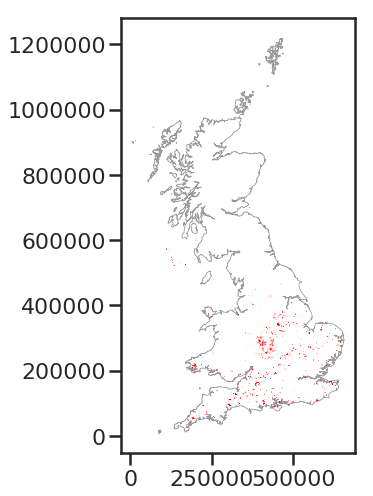

In [14]:
plot_uk(osm)
# osm.plot()

In [15]:
# Check we have usable polygons and drop if not
osm.groupby(osm.geometry.type).count()

,id,geometry
LineString,3,3
Polygon,9508,9508


In [16]:
# Keep only polygons
osm = osm[osm.geometry.type=='Polygon']

## Histograms of OSM area

In [17]:
osm['area'] = osm.geometry.area

In [18]:
# osm

In [19]:
osm_small = osm[osm.area<500]

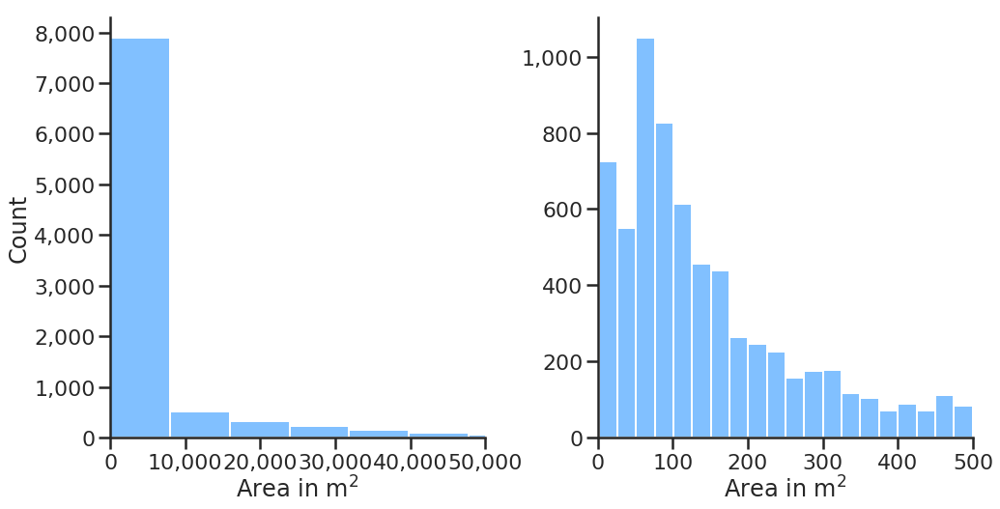

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

# https://www.sessions.edu/color-calculator/
col1 = '#ffd181' # orange
col2 = '#81c0ff' # blue
col3 = '#ff9281' # red

osm.hist(bins=100, ax=ax1, color=col2)
ax1.set_xlim(0, 50000)

osm_small.hist(bins=20, ax=ax2, color=col2)
ax2.set_xlim(0, 500)

for ax in (ax1, ax2):
    ax.get_yaxis().set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
    ax.get_xaxis().set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
    ax.grid(False)
    hide_splines(ax)
    ax.set_title(None)
    ax.set_xlabel('Area in m$^2$')

ax1.set_ylabel('Count')

plt.savefig('img/chart_osm_label_sizes.png', bounding_box='tight', dpi=200)

Make small versions of the OSM dataframe to test with.  

In [21]:
osm_test = osm[:1]

In [22]:
# Spatial join 
join = gpd.sjoin(osm, imgs)
join = join.reset_index()
# join

In [23]:
len(osm)

9508

In [24]:
len(join)

10191

In [25]:
len(join.groupby('name'))

1763

In [26]:
len(join[join.year>2012])

10191

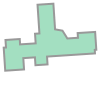

In [27]:
join.geometry[0]

CRS of GeoDataFrame is BNG / epsg:27700
CRS of GeoDataFrame is BNG / epsg:27700


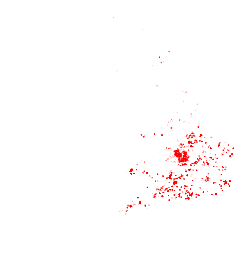

In [28]:
tile = imgs[imgs.name.isin(join.name)]
plot_tile_and_label(tile, join)

In [29]:
# poly_to_wgs(join.geometry[0])

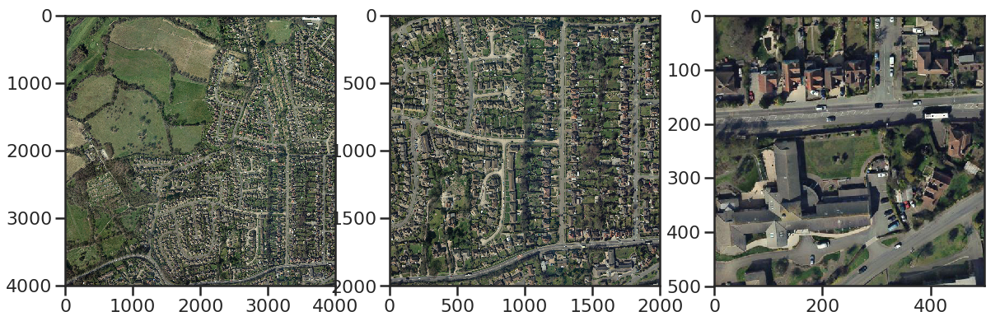

In [30]:
# Check with windowed view of image file

#https://rasterio.readthedocs.io/en/latest/topics/windowed-rw.html
#rasterio.windows.Window(col_off, row_off, width, height)
window = rasterio.windows.Window(0, 0, 4000, 4000)
window2 = rasterio.windows.Window(2000, 2000, 4000, 4000)
window3 = rasterio.windows.Window(3500, 3500, 4000, 4000)

with rasterio.open('data/labels/tq7208_l2_250_02.jpg') as src:
    subset = src.read(window=window)
    subset2 = src.read(window=window2)
    subset3 = src.read(window=window3)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,8))
show(subset, ax=ax1)
show(subset2, ax=ax2)
show(subset3, ax=ax3)

In [31]:
print(wgs(osm[osm.id=='way/28941323']).geometry[0].centroid)

POINT (0.4547523688891391 50.84600113364905)


### Progress - the tile appears to match the label.
### New problem: the image doesn't contain PV. 2013 image is too old :'(
The image is clearly visible on google maps

![](img/way_28941323.png)

1 tile looks fine. Good to have example where it returns two image tiles, ie label intersects two tiles... how to handle?

In [32]:
# Fortunately we get it straight away
osm_test = osm[1:2]

In [33]:
# Spatial join 
join = gpd.sjoin(osm_test, imgs)
join

,id,geometry,area,index_right,name,lat,lon,folder,year
1,way/29169304,"POLYGON ((398981.2178836357 473330.8199716299,...",194.97,97091,/media/mount/data/2015/sd/sd9873_rgb_250_02,398000.12,473999.87,sd,2015
1,way/29169304,"POLYGON ((398981.2178836357 473330.8199716299,...",194.97,97079,/media/mount/data/2015/sd/sd9973_rgb_250_02,399000.12,473999.87,sd,2015


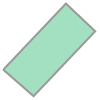

In [34]:
join.iloc[1].geometry

CRS of GeoDataFrame is BNG / epsg:27700
CRS of GeoDataFrame is BNG / epsg:27700


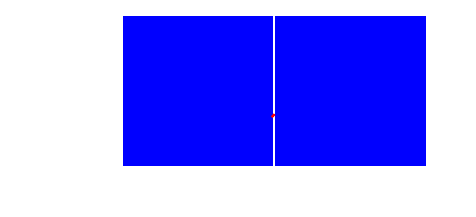

In [35]:
# get tile rows from imgs dataframe
tiles = imgs[imgs.name.isin(join.name)]
plot_tile_and_label(tiles, join)

Return intersections instead

In [36]:
intersect = gpd.overlay(osm_test, imgs, how='intersection')

In [37]:
intersect

,id,area,name,lat,lon,folder,year,geometry
0,way/29169304,194.97,/media/mount/data/2015/sd/sd9873_rgb_250_02,398000.12,473999.87,sd,2015,"POLYGON ((398981.2178836357 473330.8199716299,..."
1,way/29169304,194.97,/media/mount/data/2015/sd/sd9973_rgb_250_02,399000.12,473999.87,sd,2015,"POLYGON ((398999.999 473341.5894494341, 399002..."


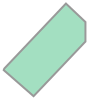

In [38]:
intersect.geometry[0]

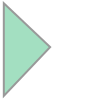

In [39]:
intersect.geometry[1]

In [40]:
join.name[1]

1    /media/mount/data/2015/sd/sd9873_rgb_250_02
1    /media/mount/data/2015/sd/sd9973_rgb_250_02
Name: name, dtype: object

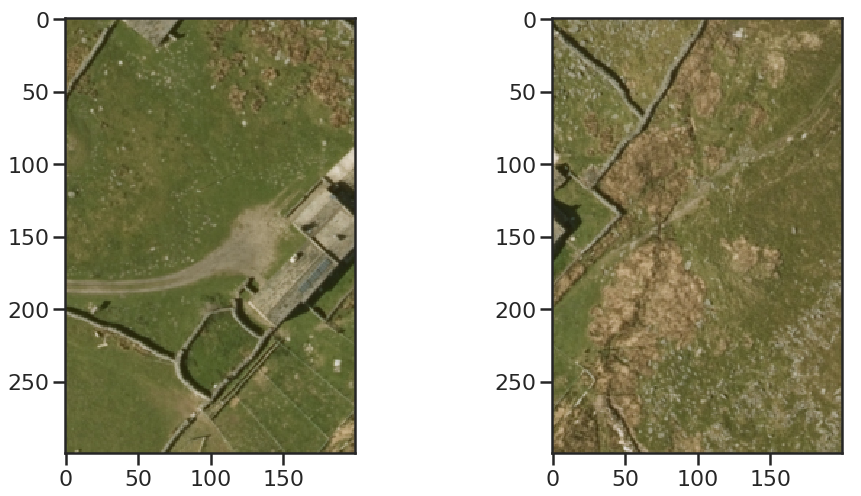

In [41]:
window1 = rasterio.windows.Window(3800, 2500, 200, 300)
window2 = rasterio.windows.Window(0, 2500, 200, 300)

with rasterio.open('data/labels/sd9873_rgb_250_02.jpg') as src:
    subset = src.read(window=window1)
with rasterio.open('data/labels/sd9973_rgb_250_02.jpg') as src:
    subset2 = src.read(window=window2)
    
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
show(subset, ax=ax1)
show(subset2, ax=ax2)

Ok, so looks like the intersection area is very small on the right hand image.  
So need a step where I remove any geometries smaller than a certain area.  
**The spatial join needs to produce the intersection geometries, not the original label geometry.**

In [42]:
# Done using intersection set operation, rather than spatial join
# intersect = gpd.overlay(osm_test, imgs, how='intersection')

### Testing join results

In [43]:
print(list(wgs(join).geometry.centroid)[0])

POINT (-2.016936178852847 54.15582981738743)


Fuck me sideways, this one does appear on google maps as PV on the roof of the Hag Dyke Hostel, Skipton

In [44]:
osm_test = osm[2:3]
intersect = gpd.overlay(osm_test, imgs, how='intersection')

In [45]:
osm_test

,id,geometry,area
2,way/30813429,"POLYGON ((528435.5475592255 166382.4136898199,...",152.11


In [46]:
intersect

,id,area,name,lat,lon,folder,year,geometry
0,way/30813429,152.11,/media/mount/data/2013/tq/tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528435.5475592255 166382.4136898199,..."


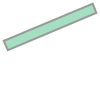

In [47]:
intersect.geometry[0]

CRS of GeoDataFrame is BNG / epsg:27700
CRS of GeoDataFrame is BNG / epsg:27700


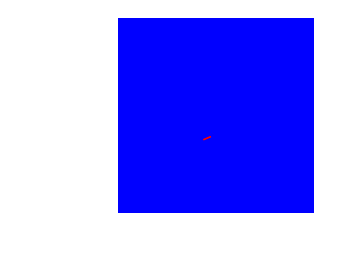

In [48]:
tiles = imgs[imgs.name.isin(intersect.name)]
plot_tile_and_label(tiles, intersect)

In [49]:
print(wgs(intersect).geometry.centroid[0])

POINT (-0.1555528198138076 51.38201396437926)


In [50]:
intersect.name[0]

'/media/mount/data/2013/tq/tq2866_l2_250_01'

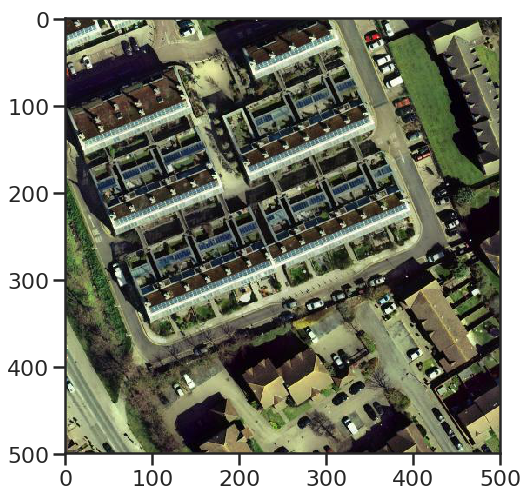

In [51]:
window = rasterio.windows.Window(1500, 2200, 500, 500)

# with rasterio.open(intersect.name[0] + '.jpg') as src:
with rasterio.open('data/labels/tq2866_l2_250_01.jpg') as src:
    subset = src.read(window=window)

fig, ax = plt.subplots(figsize=(8,8))
show(subset, ax=ax)

BedZed Eco village  
Labels: The primary school at 51.381309, -0.158803 has a nice array.

### Use geometry_mask to create mask from the labels
https://rasterio.readthedocs.io/en/stable/api/rasterio.features.html#rasterio.features.geometry_mask  

### Get transform for each image tile
First need the transform object for each worldfile polygon  
**transform (Affine transformation object) – Transformation from pixel coordinates of source to the coordinate system of the input shapes. See the transform property of dataset objects.**   

Hopefully can get from the polygon  
https://rasterio.readthedocs.io/en/stable/api/rasterio.transform.html

In [52]:
# Get Polygon geometry bounds
bounds = imgs[imgs['name'] == intersect.name[0]].geometry.iloc[0].bounds
width = 4000
height = 4000
transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], width, height)
transform

Affine(0.2500005000000238, 0.0, 527999.999,
       0.0, -0.25000049999999463, 166999.751)

### Get geometry mask of shape using transform (needed for checking, not for labelling)

In [53]:
intersect

,id,area,name,lat,lon,folder,year,geometry
0,way/30813429,152.11,/media/mount/data/2013/tq/tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528435.5475592255 166382.4136898199,..."


In [54]:
# geometry_mask(geometries, out_shape, transform, all_touched=False, invert=False)
mask = geometry_mask(intersect.geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)
# mask

Combine with image from above

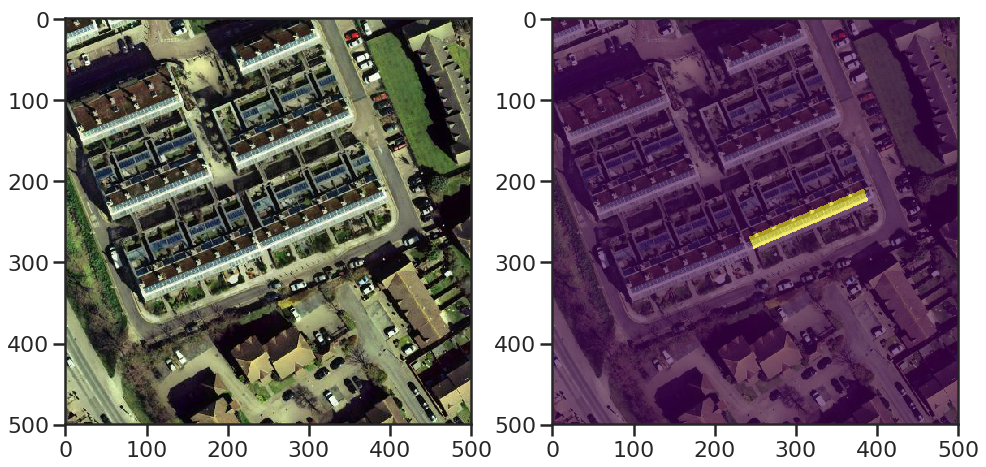

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,16))

window = rasterio.windows.Window(1500, 2200, 500, 500)
with rasterio.open('data/labels/tq2866_l2_250_01.jpg') as src:
    subset = src.read(window=window)
show(subset, ax=ax1)
show(subset, ax=ax2)
# show(mask[1500:2000, 2200:2700], ax=ax2, alpha=0.2)

# Note the mask coordinates are other way round from the Window bounds
show(mask[2200:2700, 1500:2000], ax=ax2, alpha=0.6, cmap='viridis')

The above looks nice. But would be better to show all the labels for that one image tile.  
Which I will do next.

###  Package it up

for every OSM label, get an array of intersection geometries with the intersecting image tilenames.  
Note OSM dataframe needs to contain only POLYGONs or this overlay will not work.  
That is why linestrings were removed in step 3.1

In [56]:
# Overlay operation for all OSM labels and img tiles.
intersects = gpd.overlay(osm, imgs, how='intersection')

In [57]:
intersects.head()

,id,area,name,lat,lon,folder,year,geometry
0,way/28941323,1575.79,/media/mount/data/2013/tq/tq7208_l2_250_02,572000.12,108999.88,tq,2013,"POLYGON ((572876.7213706167 108037.6732236688,..."
1,way/29169304,194.97,/media/mount/data/2015/sd/sd9873_rgb_250_02,398000.12,473999.87,sd,2015,"POLYGON ((398981.2178836357 473330.8199716299,..."
2,way/29169304,194.97,/media/mount/data/2015/sd/sd9973_rgb_250_02,399000.12,473999.87,sd,2015,"POLYGON ((398999.999 473341.5894494341, 399002..."
3,way/30813429,152.11,/media/mount/data/2013/tq/tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528435.5475592255 166382.4136898199,..."
4,way/30813430,146.02,/media/mount/data/2013/tq/tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528432.1861998485 166380.682315394, ..."


In [58]:
intersects.groupby('id').count().groupby('name').count()

,area,lat,lon,folder,year,geometry
name,,,,,,
1,7958,7958,7958,7958,7958,7958
2,930,930,930,930,930,930
3,51,51,51,51,51,51
4,55,55,55,55,55,55


7958 labels fully within image tile boundaries, 930 intersecting two image tiles, 51 intersecting 3 tiles and 55 intersecting 4.  
What do the 3 intersections look like?  
Are these overlapping tiles?  

### Remove tiny arrays and giant solar farms?

In [59]:
len(intersects)

10191

In [60]:
len(intersects[intersects.geometry.area < 1000])

7551

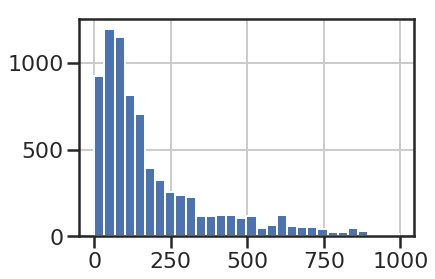

In [61]:
intersects[intersects.geometry.area < 1000].geometry.area.hist(bins=30)

In [62]:
arrays = intersects[(intersects.geometry.area > 20) & (intersects.geometry.area < 1000)]

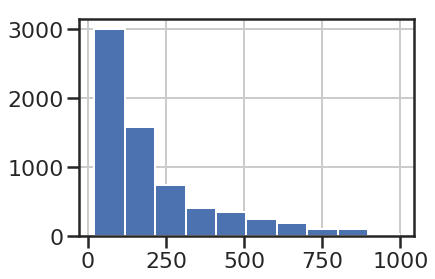

In [63]:
arrays.geometry.area.hist()

In [64]:
arrays.groupby('id').count().groupby('name').count()

,area,lat,lon,folder,year,geometry
name,,,,,,
1,6234,6234,6234,6234,6234,6234
2,272,272,272,272,272,272
3,2,2,2,2,2,2
4,1,1,1,1,1,1


What do the very big and very small array labels left out here look like?

In [65]:
arrays.head(1)

,id,area,name,lat,lon,folder,year,geometry
1,way/29169304,194.97,/media/mount/data/2015/sd/sd9873_rgb_250_02,398000.12,473999.87,sd,2015,"POLYGON ((398981.2178836357 473330.8199716299,..."


## Dissolve by tilename so one label row per tile
Later I may want to be able to id the number of PV arrays in a tile / ID the arrays found...

### BEWARE HERE. Dissolving these ways is creating big solar farms again instead of smaller ways... maybe that is better? 

In [66]:
# turn arrays into image tile labels by combining on filenames
labels = arrays.dissolve('name').reset_index()

In [67]:
labels.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1009 entries, 0 to 1008
Data columns (total 8 columns):
name        1009 non-null object
geometry    1009 non-null object
id          1009 non-null object
area        1009 non-null float64
lat         1009 non-null float64
lon         1009 non-null float64
folder      1009 non-null object
year        1009 non-null int64
dtypes: float64(3), int64(1), object(4)
memory usage: 63.1+ KB


In [68]:
labels.groupby('year').count()

,name,geometry,id,area,lat,lon,folder
year,,,,,,,
2013,636,636,636,636,636,636,636
2014,44,44,44,44,44,44,44
2015,141,141,141,141,141,141,141
2017,188,188,188,188,188,188,188


In [69]:
labels_all = intersects.dissolve('name').reset_index()

In [70]:
labels_all.groupby('year').count()

,name,geometry,id,area,lat,lon,folder
year,,,,,,,
2013,770,770,770,770,770,770,770
2014,81,81,81,81,81,81,81
2015,387,387,387,387,387,387,387
2017,525,525,525,525,525,525,525


That's what we're giving up by removing the sizes!

## Fetch all images and keep directory structure
## Deprecated in favour of dumping them all in one folder as all filenames are unique

In [71]:
# are there name collisions between years?
# Not with full filepath
print(len(imgs.name), len(imgs.name.unique()))
#All filenames are unique. So the folder structure above can be dispensed with.
filenames = imgs.name.str.extract(r'(\/[a-z0-9_]+$)')
len(filenames), len(filenames[0].unique())

209002 209002


(209002, 209002)

In [72]:
# Let's move all the images from labels_all into local storage
labels_all.head(1)

,name,geometry,id,area,lat,lon,folder,year
0,/media/mount/data/2013/no/no6345_rgb_250_02,"POLYGON ((364000.001 745741.3926259922, 363963...",way/676771889,113980.20,363000.12,745999.87,no,2013


In [73]:
# # Create directories if they do not already exist

# # Make label folder in dropbox
# os.makedirs('data/labels', exist_ok=True)

# for i, row in labels_all.iterrows():
#     img = row['name'] + '.jpg'
#     world = row['name'] + '.jgw'
#     img_dst = row['name'].replace('/media/mount/data/', 'data/labels/') + '.jpg'
#     world_dst = row['name'].replace('/media/mount/data/', 'data/labels/') + '.jgw'
#     # Make directories
#     os.makedirs(os.path.dirname(img_dst), exist_ok=True)
#     copyfile(src=img, dst=img_dst)
#     copyfile(src=world, dst=world_dst)
# print('Copied all image files to dropbox')

In [74]:
# # Check files are where they should be
# TARG_DIR = 'data/labels/'
# GLOB_PARMS = "*/*/*.jpg" # 

# for file in labels_all.name + '.jpg':
#     if file not in glob.glob(os.path.join(TARG_DIR, GLOB_PARMS)):
# #         shutil.copy(file,TARG_DIR)
#         print(f'file {file} not there')
#     else:
# #         print(f"File exists {file}")
#         pass

All files in dropbox locally.

In [75]:
!du -h -d 1 data/labels # d flag is for depth --max-depth=N

# output
# 4.1G	data/labels/2015
# 931M	data/labels/2014
# 6.9G	data/labels/2013
# 5.8G	data/labels/2017
# 18G	data/labels


18G	data/labels


### New data copy

In [76]:
# for i, row in labels_all.iterrows():
#     path = Path(row['name'])
#     img_file = path.with_suffix('.jpg')
#     world_file = path.with_suffix('.jgw')
#     dst = 'data/labels/'
#     copyfile(src=img_file, dst=dst + img_file.name)
#     copyfile(src=world_file, dst=dst + world_file.name)
# print('Copied all image files to dropbox')

In [77]:
# Change the file paths now I have them locally
labels_all['name'] = labels_all.name.str.extract(r'(\/[a-z0-9_]+$)')[0]
labels['name'] = labels.name.str.extract(r'(\/[a-z0-9_]+$)')[0]
labels['name'] = 'data/labels/' + labels['name'].str.strip('/')
labels_all['name'] = 'data/labels/' + labels_all['name'].str.strip('/')

In [78]:
# plot_uk(labels)

In [79]:
labels_all.head()

,name,geometry,id,area,lat,lon,folder,year
0,data/labels/no6345_rgb_250_02,"POLYGON ((364000.001 745741.3926259922, 363963...",way/676771889,113980.20,363000.12,745999.87,no,2013
1,data/labels/no6445_rgb_250_02,"POLYGON ((364286.5948702395 745999.746, 364225...",way/676771889,113980.20,364000.12,745999.87,no,2013
2,data/labels/no6446_rgb_250_02,"POLYGON ((364383.1617593989 746087.9043356234,...",way/676771889,113980.20,364000.12,746999.87,no,2013
3,data/labels/sh9877_l2_250_02,(POLYGON ((298526.3057924936 377826.4192833025...,way/682303407,7386.00,298000.12,377999.88,sh,2013
4,data/labels/sj8600_l2_250_03,(POLYGON ((386651.7395135158 300007.4665355057...,way/546029666,87.05,386000.12,300999.88,sj,2013


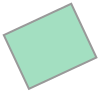

In [80]:
labels.iloc[np.random.randint(len(labels))].geometry

In [81]:
# A few very big solar farms still...
max(labels.geometry.area)

100669.3838097099

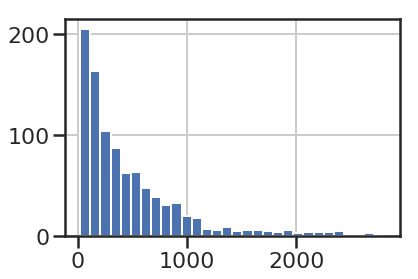

In [82]:
labels[labels.geometry.area < 3000].geometry.area.hist(bins=30)

In [83]:
# Could be worth chopping off the largest farms again
len(labels), len(labels[labels.geometry.area < 5000])

(1009, 973)

In [84]:
labels_nofarms = labels[labels.geometry.area < 5000]

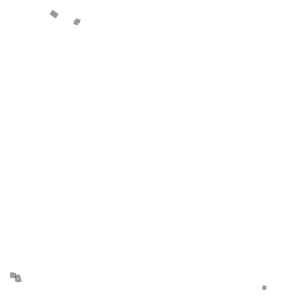

In [85]:
labels_nofarms.iloc[np.random.randint(len(labels_nofarms))].geometry

In [86]:
labels_nofarms.groupby('year').count()

,name,geometry,id,area,lat,lon,folder
year,,,,,,,
2013,632,632,632,632,632,632,632
2014,43,43,43,43,43,43,43
2015,129,129,129,129,129,129,129
2017,169,169,169,169,169,169,169


## Decide on files to work with and check accuracy

In [87]:
labels_2017 = labels_nofarms[labels_nofarms['year']==2017]

In [88]:
labels_2017.head()

,name,geometry,id,area,lat,lon,folder,year
821,data/labels/nr3059_rgb_250_03,(POLYGON ((130824.0871871061 659742.3375574924...,way/679895529,54.30,130000.12,659999.87,nr,2017
822,data/labels/sd6835_rgb_250_01,(POLYGON ((368917.2726637713 435965.7690755849...,way/696018119,37.87,368000.12,435999.87,sd,2017
823,data/labels/se2931_rgb_250_02,"POLYGON ((429177.171694509 431546.2743241068, ...",way/694978802,513.84,429000.12,431999.87,se,2017
824,data/labels/se3636_rgb_250_01,"POLYGON ((436446.8124937971 436081.8867937971,...",way/690498253,49.21,436000.12,436999.87,se,2017
825,data/labels/se6154_rgb_250_03,"POLYGON ((461707.1012881708 454276.5307027344,...",way/537225405,113.96,461000.12,454999.87,se,2017


18GB of label image tiles.

In [89]:
print(f'There are {len(labels_all)} total image tiles with labels')
print(f'There are {len(labels_2017)} image tiles without solar farms from 2017')

There are 1763 total image tiles with labels
There are 169 image tiles without solar farms from 2017


## Prepare them for RasterVision ie labels to geojson files

I think the labels shouldn't be dissolved into a single geometry.

In [90]:
# Check sample
# geojson =  '/home/laurence/projects/raster-vision/data/SpaceNet_Buildings_Dataset_Round2/spacenetV2_Train/AOI_2_Vegas/geojson/buildings/buildings_AOI_2_Vegas_img1000.geojson'
# gpd.read_file(geojson)

### But how to remove solar farms?

### group by filename and keep as GeoDataFrame -> geojson

In [91]:
# reset pv definition - this is known as 'arrays' above
pv_arrays = intersects[(intersects.geometry.area > 20) & (intersects.geometry.area < 1000)].copy()

In [92]:
pv_arrays['name'] = pv_arrays['name'].str.extract(r'(\/[a-z0-9_]+$)')[0].str.strip('/')

In [93]:
pv_arrays.head(1)

,id,area,name,lat,lon,folder,year,geometry
1,way/29169304,194.97,sd9873_rgb_250_02,398000.12,473999.87,sd,2015,"POLYGON ((398981.2178836357 473330.8199716299,..."


In [94]:
# Create a dict of dataframes by filename
labels_dict = {k: v for k, v in pv_arrays.groupby('name')}

# Create GeoJSON

In [95]:
# Create the geojson label files (don't need to do this twice)
# for name in pv_arrays['name'].unique():
#     labels_dict[name].to_file(f"data/labels/{name}.geojson", driver='GeoJSON')

## Labels, images and worldfiles all present

Get on with rastervision

## Better mask picture
BedZed Eco Village

In [96]:
labels_dict['tq2866_l2_250_01']

,id,area,name,lat,lon,folder,year,geometry
3,way/30813429,152.11,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528435.5475592255 166382.4136898199,..."
4,way/30813430,146.02,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528432.1861998485 166380.682315394, ..."
5,way/35802295,126.79,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528424.8447581473 166406.8023679745,..."
6,way/35802296,122.18,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528359.8786321275 166439.551822861, ..."
7,way/35802297,131.68,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528354.003344939 166455.560816239, 5..."
8,way/35802298,74.47,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528424.826539577 166437.7021501691, ..."
9,way/35802299,119.88,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528386.279504868 166391.4673267322, ..."
10,way/35802300,106.51,tq2866_l2_250_01,528000.12,166999.88,tq,2013,"POLYGON ((528377.6078940012 166414.5607755606,..."


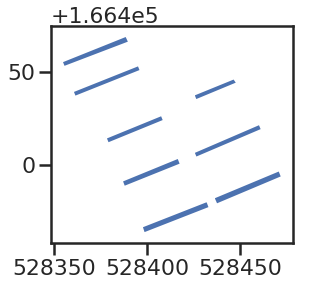

In [97]:
labels_dict['tq2866_l2_250_01'].plot()

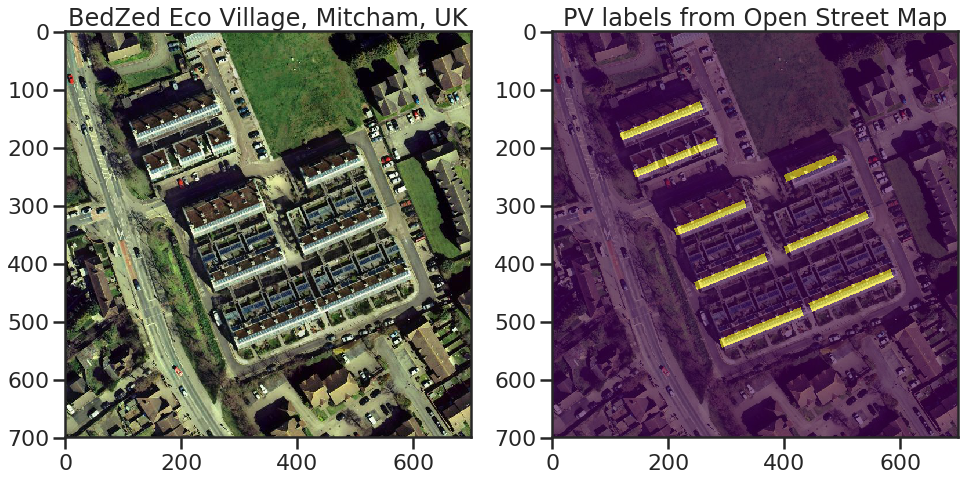

In [98]:
img_file = 'data/labels/' + labels_dict['tq2866_l2_250_01'].name.unique()[0] + '.jpg'
mask = geometry_mask(labels_dict['tq2866_l2_250_01'].geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

window = rasterio.windows.Window(1300, 2000, 700, 700)
with rasterio.open(img_file) as src:
    subset = src.read(window=window)
show(subset, ax=ax1)
show(subset, ax=ax2)
# show(mask[1500:2000, 2200:2700], ax=ax2, alpha=0.2)

# Note the mask coordinates are other way round from the Window bounds
show(mask[2000:2700, 1300:2000], ax=ax2, alpha=0.6, cmap='viridis')
# ax1.axis('off')
# ax2.axis('off')
ax1.title.set_text('BedZed Eco Village, Mitcham, UK')
ax2.title.set_text('PV labels from Open Street Map')
# plt.savefig('img/chart_OSM_label_example_bedzed.png', dpi=300, transparent=True)

## Pickle GeoJSON

In [99]:
# pv_arrays.to_file('data/pv_arrays_labels.geojson', driver='GeoJSON')
# Gives me an error :/

### New insight: GeoJSON needs to be in WGS84. Images need to have CRS specified (any, as long as it is specified)

In [100]:
# Pickle / read from pickle
# pv_arrays.to_pickle('data/pv_arrays_labels_pickle.pkl')
pv_arrays = pd.read_pickle('data/pv_arrays_labels_pickle.pkl')

In [101]:
pv_arrays = wgs(pv_arrays)

In [102]:
# Recreate labels dict again from pickle (if starting further down... :/)
labels_dict2 = {k: v for k, v in pv_arrays.groupby('name')}

## Export again

In [103]:
# Create the geojson label files (don't need to do this twice)
# for name in pv_arrays['name'].unique():
#     labels_dict2[name].to_file(f"/home/laurence/projects/raster-vision/data/labels2/{name}.geojson", driver='GeoJSON')

## Try a file in Web Mercator to see if it fixes label alignment issues

In [104]:
pv_arrays.to_crs(epsg=3857).head(1)

,id,name,lat,lon,folder,year,geometry
1,way/29169304,sd9873_rgb_250_02,398000.12,473999.87,sd,2015,POLYGON ((-224542.1150343886 7199716.723686386...


In [105]:
 wgs(pv_arrays).head(1)

,id,name,lat,lon,folder,year,geometry
1,way/29169304,sd9873_rgb_250_02,398000.12,473999.87,sd,2015,POLYGON ((-2.017096138639151 54.15579149316435...


In [106]:
# pv_arrays.head(100)

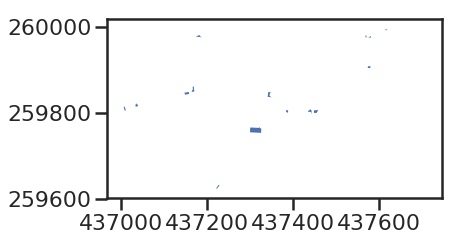

In [107]:
# labels_dict['sp1182_l2_250_04'].plot()
labels_dict['sp3759_l2_250_03'].plot()

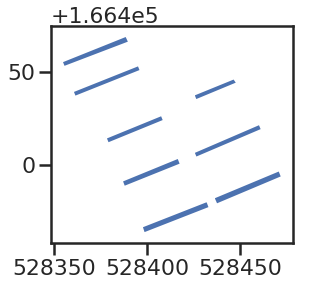

In [108]:
labels_dict['tq2866_l2_250_01'].plot()

# RasterVision time

In [209]:
# Largest number of labels on image tiles
pv_arrays.groupby('name').count().sort_values('id', ascending=False).head(30)

,id,lat,lon,folder,year,geometry
name,,,,,,
st1528_rgb_250_04,273,273,273,273,273,273
st1826_rgb_250_04,225,225,225,225,225,225
tf4814_l2_250_03,221,221,221,221,221,221
sy0196_rgb_250_03,192,192,192,192,192,192
tf4815_l2_250_03,165,165,165,165,165,165
sy0097_rgb_250_03,140,140,140,140,140,140
tr0261_rgb_250_03,125,125,125,125,125,125
sj9004_rgb_250_05,121,121,121,121,121,121
st0103_rgb_250_03,120,120,120,120,120,120


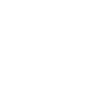

In [213]:
pv_arrays[pv_arrays.name=='sp1485_l2_250_02'].geometry.values[0]

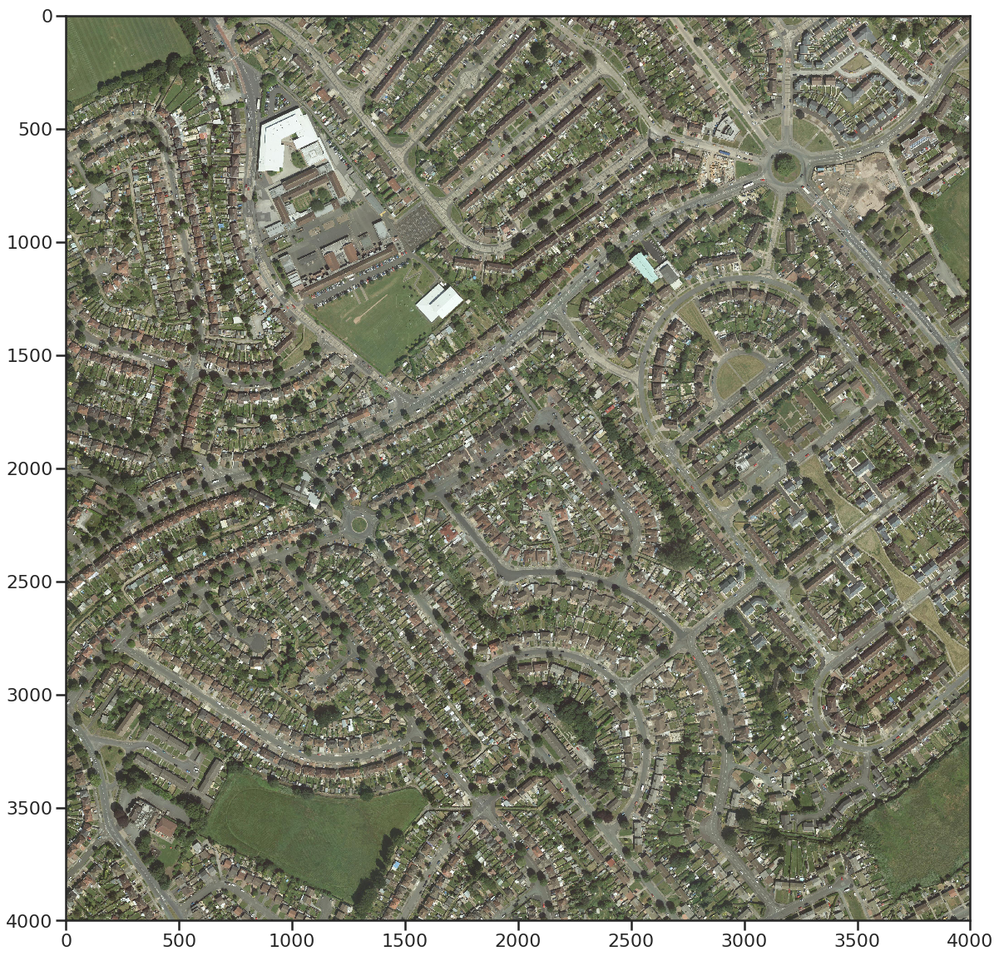

In [215]:
fig, ax = plt.subplots(figsize=(20,20))
with rasterio.open('/home/laurence/projects/raster-vision/data/labels2/sp1485_l2_250_02.jpg') as src:
    show(src.read(), ax=ax)

## Create Scenes based on attributes (e.g. year)

In [110]:
len(pv_arrays[pv_arrays.year > 2016].name.unique())

188

In [111]:
# os.listdir('data/labels')

# Create custom labelled UK image

In [216]:
# Contenders: 
# sp1485_l2_250_02
# sp0685_l2_250_02

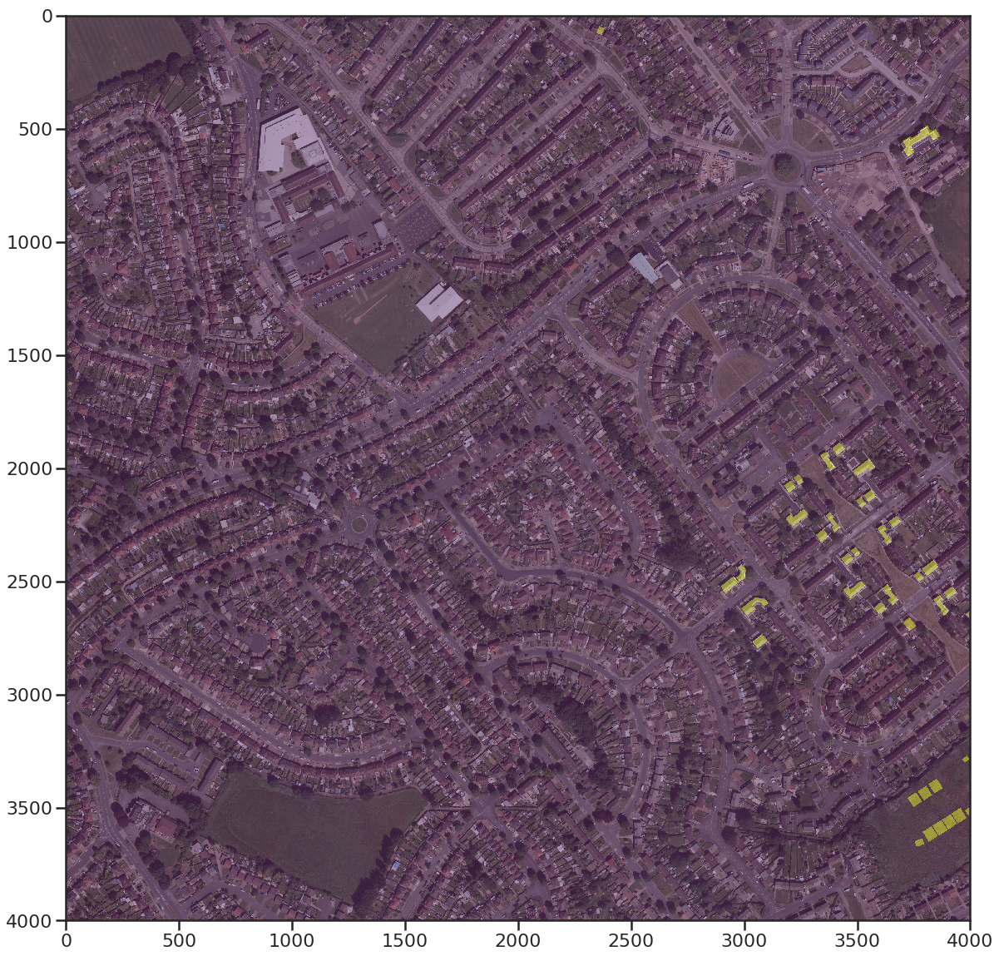

In [221]:
# sp0685_l2_250_02 is finally not a solar farm! Most of top 100 are!
# But sp0685_l2_250_02 labels are the whole fucking building

# Try sp1485_l2_250_02

id = 'sp1485_l2_250_02'
geo_t = gpd.read_file(f'data/labels/{id}.geojson')

window = rasterio.windows.Window(0, 0, 4000, 4000)
with rasterio.open(f'data/labels/{id}.jpg') as img_t:
    subset = img_t.read(window=window)
    bounds = img_t.bounds
    transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], 4000, 4000)
    mask = geometry_mask(geo_t.geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)

#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,20))
#     show(subset, ax=ax1)
#     show(subset, ax=ax2)
#     show(mask, ax=ax2, alpha=0.4, cmap='viridis')
#     ax1.axis('off')
#     ax2.axis('off')
    fig, ax = plt.subplots(figsize=(20,20))
    show(subset, ax=ax)
    show(mask, ax=ax, alpha=0.4, cmap='viridis')
    ax1.axis('off')
    plt.savefig(f'img/UK_label_verify_{id}.png', dpi=300)


### Reproject and save to data/labels_wgs84

#### Label file

In [113]:
geo_t.crs

{'init': 'epsg:27700'}

In [114]:
geo_t_wgs84 = geo_t.to_crs({'init': 'epsg:4326'})

In [115]:
geo_t_wgs84.head()

,id,name,lat,lon,folder,year,geometry
0,way/77808361,sp0685_l2_250_02,406000.12,285999.88,sp,2013,POLYGON ((-1.900363287900379 52.46597309617341...
1,way/77808366,sp0685_l2_250_02,406000.12,285999.88,sp,2013,POLYGON ((-1.901507287901137 52.46581999617328...
2,way/77808367,sp0685_l2_250_02,406000.12,285999.88,sp,2013,POLYGON ((-1.900921987900751 52.46589599617334...
3,way/77808369,sp0685_l2_250_02,406000.12,285999.88,sp,2013,POLYGON ((-1.901139087900804 52.46605299617348...
4,way/77808374,sp0685_l2_250_02,406000.12,285999.88,sp,2013,POLYGON ((-1.900827487900838 52.46559899617309...


In [116]:
geo_t_wgs84.to_file(f"data/labels_wgs84/{id}.geojson", driver='GeoJSON')

#### Image file

In [117]:
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [118]:
# make copy of image file and worldfile first
# copyfile(f'data/labels/{id}.jpg', f'data/labels_wgs84/{id}.jpg')
# copyfile(f'data/labels/{id}.jgw', f'data/labels_wgs84/{id}.jgw')

# Why the XXXXXXX isn't this working

In [119]:
id = 'sp0685_l2_250_02'
dst_crs = 'EPSG:4326'
src_crs = 'EPSG:27700' # set this explicitly

with rasterio.open(f'data/labels_wgs84/{id}.jpg') as src:
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)

print(f'{src.crs, src.crs, dst_crs, src.width, src.height, *src.bounds}')    
print(f'{transform, width, height}')

(None, None, 'EPSG:4326', 4000, 4000, 406000.0, 285000.0, 407000.0, 286000.0)
(Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0), 4000, 4000)


In [120]:
dst_crs = 'EPSG:4326'
src_crs = 'EPSG:27700' # set this explicitly

with rasterio.open(f'data/labels_wgs84/{id}.jpg', 'r') as src:
    transform, width, height = calculate_default_transform(
        src_crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    with rasterio.open(f'data/labels_wgs84/dst.jpg', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src_crs, # and change it here too
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)


In [121]:
img_reproj = rasterio.open(f'data/labels_wgs84/dst.jpg')
print(img_reproj.meta)

{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4837, 'height': 2954, 'count': 3, 'crs': CRS.from_epsg(4326), 'transform': Affine(3.047238701879914e-06, 0.0, -1.913117532718077,
       0.0, -3.047238701879914e-06, 52.471902492972845)}


In [122]:
img_reproj.close()

In [123]:
img = rasterio.open(f'data/labels/{id}.jpg')
print(img.meta)

{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': None, 'transform': Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)}


In [124]:
img.bounds

BoundingBox(left=406000.0, bottom=285000.0, right=407000.0, top=286000.0)

#### Check labels fit

4837 2954


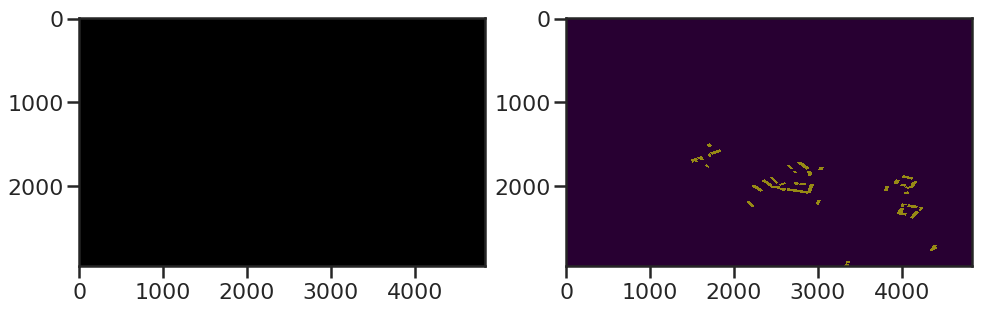

In [125]:
id = 'sp0685_l2_250_02'
geo_t = gpd.read_file(f'data/labels_wgs84/{id}.geojson')
img_t = rasterio.open(f'data/labels_wgs84/dst.jpg')

print(img_t.width, img_t.height)
window = rasterio.windows.Window(0, 0, 4837, 2954)
with rasterio.open(f'data/labels_wgs84/dst.jpg') as img_t:
    subset = img_t.read(window=window)
    
    bounds = img_t.bounds
    transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], img_t.width, img_t.height)

    #Create mask
    mask = geometry_mask(geo_t.geometry, out_shape=(img_t.height,img_t.width), transform=transform, all_touched=False, invert=True)

    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    show(subset[:3], ax=ax1)
    
    show(subset, ax=ax2)
    show(mask, ax=ax2, alpha=0.6, cmap='viridis')

# geo_t.plot(ax=ax2, color='blue')
# ax1.axis('off')
# ax2.axis('off')

In [126]:
img_t = rasterio.open(f'data/labels_wgs84/dst.jpg')

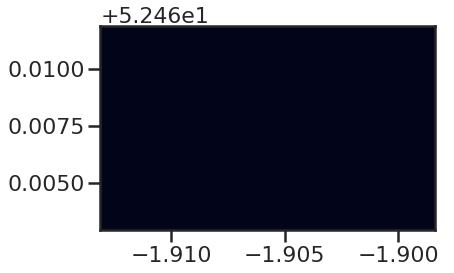

In [127]:
show(img_t)


Want to reproject the coordinate system not the fucking image file?!?!

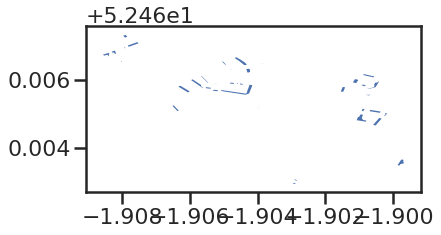

In [128]:
geo_t.plot()

###  Just do transform bounds

In [129]:
id = 'sp0685_l2_250_02'

In [130]:
dst_crs = 'EPSG:4326'
src_crs = 'EPSG:27700' # set this explicitly

with rasterio.open(f'data/labels_wgs84/{id}.jpg', 'r') as src:
    transform, width, height = calculate_default_transform(
        src_crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

with rasterio.open(f'data/labels_wgs84/dst.jpg', 'w', **kwargs) as dst:
# dst = rasterio.open(f'data/labels_wgs84/dst.jpg', 'w', **kwargs)
#         dst.close()
#         bounds = src.bounds
#         dst_bounds = transform_bounds(src_crs, dst_crs, bounds[0], bounds[1], bounds[2], bounds[3], densify_pts=21)
#         transform, width, height = calculate_default_transform(src_crs, dst_crs, src.width, src.height, *dst_bounds)
        
        kwargs = dst.meta.copy()
        kwargs.update({
            'crs': dst_crs,
#         'transform': transform,
#             'bounds': dst_bounds
        })

In [131]:
with rasterio.open(f'data/labels_wgs84/dst.jpg', 'r') as src:
    print(src.crs, src.bounds)

EPSG:4326 BoundingBox(left=-1.913117532718077, bottom=52.462900949847494, right=-1.8983780391170837, top=52.471902492972845)


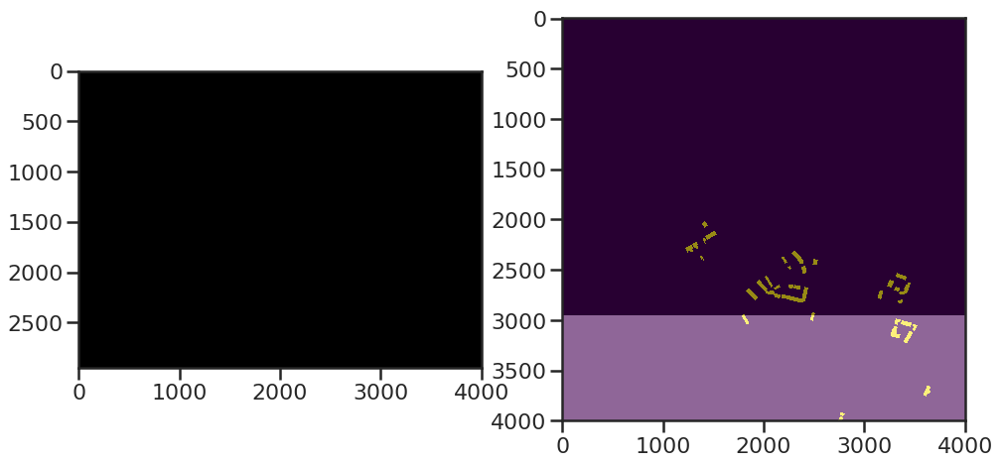

In [132]:
geo_t = gpd.read_file(f'data/labels_wgs84/{id}.geojson')

window = rasterio.windows.Window(0, 0, 4000, 4000)
with rasterio.open(f'data/labels_wgs84/dst.jpg') as img_t:
    subset = img_t.read(window=window)
    
    bounds = img_t.bounds
    transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], 4000, 4000)

    #Create mask
    mask = geometry_mask(geo_t.geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)

    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    show(subset, ax=ax1)
    
    show(subset, ax=ax2)
    show(mask, ax=ax2, alpha=0.6, cmap='viridis')

The above is wrong because the mask should get the new image size as bounds. But I don't want to squish my images anyway.



## New approach... strip CRS and give labels in pixel coordinates? 

In [133]:
src = rasterio.open(f'data/labels/{id}.jpg', 'r')
geo_t = gpd.read_file(f'data/labels/{id}.geojson')
print(src.crs, src.bounds)
print(src.meta)

None BoundingBox(left=406000.0, bottom=285000.0, right=407000.0, top=286000.0)
{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': None, 'transform': Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)}


In [134]:
geo_t.crs

{'init': 'epsg:27700'}

In [135]:
src.transform

Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)

In [136]:
crs = rasterio.crs.CRS({"init": "epsg:27700"})

In [137]:
with rasterio.open(f'data/{id}.jpg', 'r+') as src:
    src.crs = crs

In [138]:
src2 = rasterio.open(f'data/{id}.jpg', 'r+')
src2.crs

CRS.from_epsg(27700)

In [139]:
src2.meta

{'driver': 'JPEG',
 'dtype': 'uint8',
 'nodata': None,
 'width': 4000,
 'height': 4010,
 'count': 3,
 'crs': CRS.from_epsg(27700),
 'transform': Affine(0.41016656646023647, 0.0, -212967.2695698592,
        0.0, -0.41016656646023647, 6885905.3911712505)}

In [140]:
# .jgw disappears?
!ls data/ | grep sp0685_l2_250_02

sp0685_l2_250_02.jpg
sp0685_l2_250_02.jpg.aux.xml


In [141]:
def reproject_et(inpath, outpath, new_crs):
    dst_crs = new_crs # CRS for web mercator 
    src_crs = 'EPSG:27700'
    
    with rasterio.open(inpath) as src:
        transform, width, height = calculate_default_transform(
            src_crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        with rasterio.open(outpath, 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src_crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)

In [142]:
# EPSG:4326 (WGS 84) and EPSG:3857 (Web Mercator).?
# See this blog: https://lyzidiamond.com/posts/4326-vs-3857
reproject_et(inpath = f'data/labels/{id}.jpg', 
              outpath = f'data/{id}.jpg', 
              new_crs = 'EPSG:3857')

{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4010, 'count': 3, 'crs': CRS.from_epsg(3857), 'transform': Affine(0.41016656646023647, 0.0, -212967.2695698592,
       0.0, -0.41016656646023647, 6885905.3911712505)}
(4010, 4000)


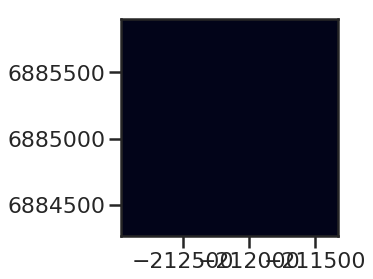

In [143]:
test = rasterio.open(f'data/{id}.jpg')
print(test.meta)
print(test.shape)
show(test)

In [144]:
test.close()

{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': None, 'transform': Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)}
(4000, 4000)


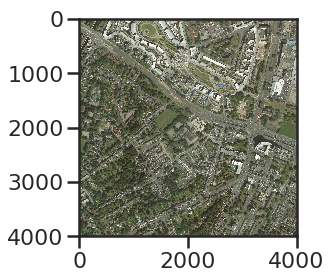

In [145]:
orig = rasterio.open(f'data/labels/{id}.jpg')
print(orig.meta)
print(orig.shape)
show(orig.read())

### Try Ground Control Points (GCP)

In [146]:
src_crs =  CRS({'init': 'EPSG:27700'}) # set this explicitly
# dst_crs = 'EPSG:3857'
dst_crs = CRS({'init': 'EPSG:4326'})

def reproject_gcp(inpath, outpath, new_crs):
    dst_crs = new_crs
    
    with rasterio.open(inpath) as src:
        transform, width, height = calculate_default_transform(
            src_crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        with rasterio.open(outpath, 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    gcps=list(src.bounds),
                    src_crs=src_crs,
#                     dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)
                
            print(src.bounds)
            print(transform_bounds(src_crs, dst_crs, src.bounds[0], src.bounds[1], src.bounds[2], src.bounds[3]))

In [147]:
# EPSG:4326 (WGS 84) and EPSG:3857 (Web Mercator).?
# See this blog: https://lyzidiamond.com/posts/4326-vs-3857
reproject_gcp(inpath = f'data/labels/{id}.jpg', 
              outpath = f'data/{id}.jpg', 
              new_crs = 'EPSG:3857')

BoundingBox(left=406000.0, bottom=285000.0, right=407000.0, top=286000.0)
(-212967.2695698592, 6884260.546726631, -211326.52904454875, 6885905.3911712505)


----------
************** Original ************
{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': None, 'transform': Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)}
(4000, 4000)
************** Transformed ************
{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4010, 'count': 3, 'crs': CRS.from_epsg(3857), 'transform': Affine(0.41016656646023647, 0.0, -212967.2695698592,
       0.0, -0.41016656646023647, 6885905.3911712505)}
(4010, 4000)


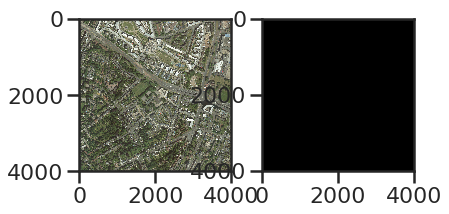

In [148]:
fig, (ax1, ax2) = plt.subplots(1,2)

orig = rasterio.open(f'data/labels/{id}.jpg')
print('-'*10)
print('************** Original ************')
print(orig.meta)
print(orig.shape)
show(orig.read(), ax=ax1)

test = rasterio.open(f'data/{id}.jpg')
print('************** Transformed ************')
print(test.meta)
print(test.shape)
show(test.read(), ax=ax2)

## Can I generate labels in pixel coordinates to match the images?
IE remove geographic information

In [149]:
test = rasterio.open('data/label_tests/img.jpg')
test_l = gpd.read_file('data/label_tests/label.geojson')

Plotting the overlay mask works well. It doesn't work if the label (test_l) geometry is not in BNG ie ESPG27700.  
But the mask is just an np array.  
But it is created using the transform which uses the bounds.  
If the geometry is different, the transform doesn't find the correct overlay. 

In [150]:
test.meta

{'driver': 'JPEG',
 'dtype': 'uint8',
 'nodata': None,
 'width': 4000,
 'height': 4000,
 'count': 3,
 'crs': None,
 'transform': Affine(0.25, 0.0, 406000.0,
        0.0, -0.25, 286000.0)}

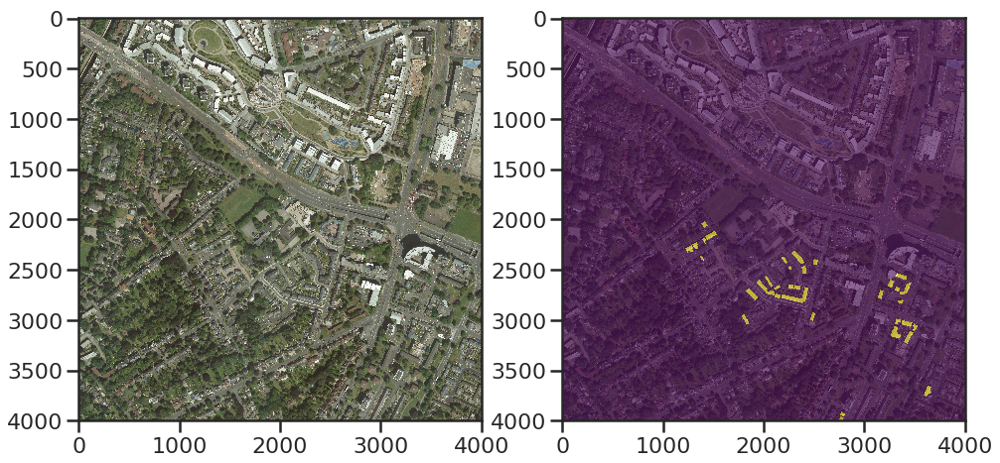

In [151]:
bounds = test.bounds
transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], 4000, 4000)
#Create mask
mask = geometry_mask(test_l.geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
show(test.read(), ax=ax1)

show(test.read(), ax=ax2)
show(mask, ax=ax2, alpha=0.6, cmap='viridis')

In [152]:
# Change the transform of the test image
test.transform

Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)

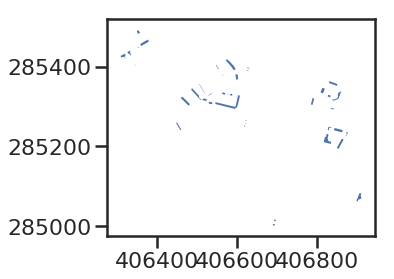

In [153]:
test_l.plot()

In [154]:
import numpy as np
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

dst_crs = 'EPSG:4326'
# Set source CRS explicitly... or leave blank?
src_crs = 'EPSG:27700'

with rasterio.open('data/label_tests/img.jpg') as src:
    transform, width, height = calculate_default_transform(
        src_crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    with rasterio.open('data/label_tests/reproj2.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src_crs,
                dst_transform=transform,
                dst_crs=dst_crs)
#                 resampling=Resampling.nearest)


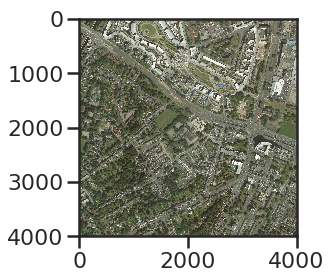

In [155]:
show(test.read())

In [156]:
reproj = rasterio.open('data/label_tests/reproj2.tif')

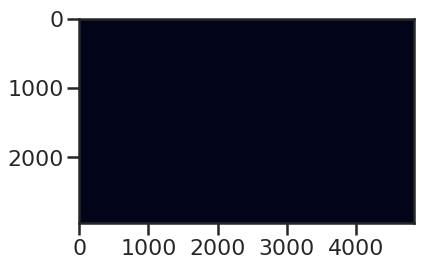

In [157]:
show(reproj.read(1))

In [158]:
reproj.meta

{'driver': 'JPEG',
 'dtype': 'uint8',
 'nodata': None,
 'width': 4837,
 'height': 2954,
 'count': 3,
 'crs': CRS.from_epsg(4326),
 'transform': Affine(3.047238701879914e-06, 0.0, -1.913117532718077,
        0.0, -3.047238701879914e-06, 52.471902492972845)}

Humm. Have reprojected from NO CRS, and now the affine transform is the same, but the CRS is updated. Presumably the labels now won't overlap... or will they??

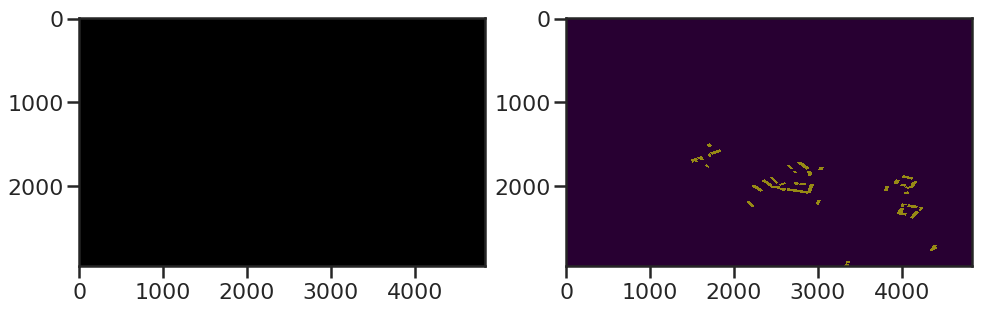

In [159]:
bounds = reproj.bounds
transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], 4837, 2954)

#Create mask  - in WGS84? Better not or it doesn't work.
mask = geometry_mask(wgs(test_l).geometry, out_shape=(2954, 4837), transform=transform, all_touched=False, invert=True)

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
show(reproj.read(), ax=ax1)

show(reproj.read(), ax=ax2)
show(mask, ax=ax2, alpha=0.6, cmap='viridis')

In [160]:
# Fucking show me the projection you cunt

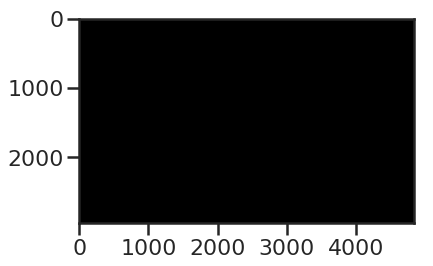

In [161]:
show(reproj.read())

#### Still really don't like the reprojection.. and worrying I can't seem to see it.

Convert labels to raster straight away...?  
Above we use the image bounds to create the mask raster.  
Then export as raster label?

In [162]:
bounds = test.bounds
transform = rasterio.transform.from_bounds(bounds[0], bounds[1], bounds[2], bounds[3], 4000, 4000)
#Create mask
mask = geometry_mask(test_l.geometry, out_shape=(4000,4000), transform=transform, all_touched=False, invert=True)

In [163]:
mask

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [164]:
type(mask)

numpy.ndarray

In [165]:
msk = (~mask * 255).astype('uint8')

In [166]:
new_dataset = rasterio.open(
    'data/label_tests/label.tif',
    'w',
    driver='GTiff',
    height=test.height,
    width=test.width,
    dtype=rasterio.uint8,
    count=1,
    crs=test.crs,
    transform=test.transform,
)

In [167]:
new_dataset.write(msk, 1)
new_dataset.close()

In [168]:
check = rasterio.open('data/label_tests/label.tif', mode="r")

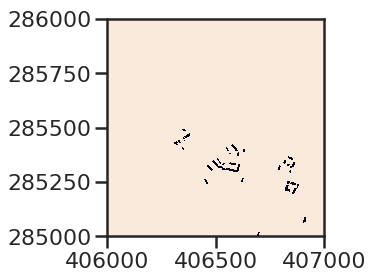

In [169]:
show(check)

In [170]:
check.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 4000,
 'height': 4000,
 'count': 1,
 'crs': None,
 'transform': Affine(0.25, 0.0, 406000.0,
        0.0, -0.25, 286000.0)}

In [171]:
test_w = rasterio.open('data/label_tests/img_w.jpg', 'r+')

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = get_writer_for_path(path)(path, mode, driver=driver, sharing=sharing, **kwargs)


In [172]:
test_w.crs = CRS.from_epsg(27700)
# 

In [173]:
test_w.lnglat()

(-7.5274754404183595, 49.75022931265909)

In [174]:
test_w.bounds

BoundingBox(left=0.0, bottom=-4000.0, right=4000.0, top=0.0)

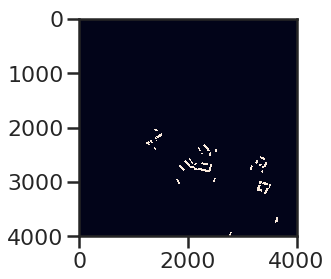

In [175]:
show(mask)

In [176]:
# Write out created mask into the mask channel of the raster
# https://rasterio.readthedocs.io/en/stable/topics/masks.html
test_w.write_mask(mask)

In [177]:
test_w.close()

In [178]:
!ls data/label_tests

img.jgw			  img_w.jpg.aux.xml    reproj2.tif
img.jpg			  img_w_mask.tif       reproj2.tif.aux.xml
img_with_crs.geojson	  label.geojson        reproj.jpg
img_with_crs.jpg	  label.tif	       reproj.jpg.aux.xml
img_with_crs.jpg.aux.xml  reproj2.jpg
img_w.jpg		  reproj2.jpg.aux.xml


In [179]:
test_w = rasterio.open('data/label_tests/img_w.jpg')
msk = test_w.read_masks()

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [180]:
with rasterio.open('data/label_tests/img_w.jpg') as src_dataset:

    # Get a copy of the source dataset's profile. Thus our
    # destination dataset will have the same dimensions,
    # number of bands, data type, and georeferencing as the
    # source dataset.
    kwds = src_dataset.profile

    # Change the format driver for the destination dataset to
    # 'GTiff', short for GeoTIFF.
    kwds['driver'] = 'GTiff'

#     # Add GeoTIFF-specific keyword arguments.
#     kwds['tiled'] = True
#     kwds['blockxsize'] = 256
#     kwds['blockysize'] = 256
#     kwds['photometric'] = 'YCbCr'
#     kwds['compress'] = 'JPEG'

    with rasterio.open('data/label_tests/img_w_mask.tif', 'w', **kwds) as dst_dataset:
        # Write data to the destination dataset.
        dst_dataset.write(mask.astype(rasterio.uint8), 1)

/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/laurence/anaconda3/lib/python3.7/site-packages/rasterio/__init__.py:226: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  **kwargs)


In [181]:
test_w_mask = rasterio.open('data/label_tests/img_w_mask.tif')

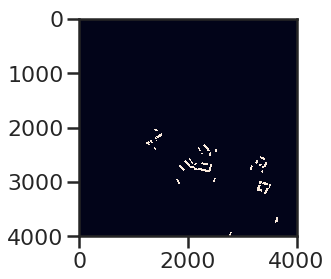

In [182]:
show(mask)

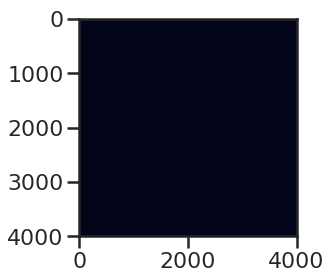

In [183]:
show(test_w_mask)

In [184]:
test_w.crs

CRS.from_epsg(27700)

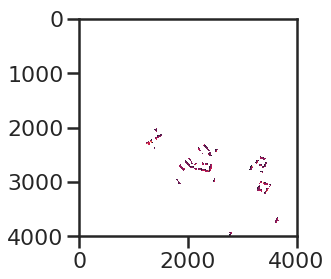

In [185]:
show(test_w)

In [186]:
original = rasterio.open('data/label_tests/img.jpg', 'r')
transform = original.transform

In [187]:
with rasterio.open('data/label_tests/img_with_crs.jpg', 'r+') as src:
    src.crs = CRS.from_epsg(27700)

In [188]:
src = rasterio.open('data/label_tests/img_with_crs.jpg', 'r')
print(src.meta)

{'driver': 'JPEG', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': CRS.from_epsg(27700), 'transform': Affine(0.25, 0.0, 406000.0,
       0.0, -0.25, 286000.0)}


In [189]:
test_l.crs

{'init': 'epsg:27700'}

## Reproject labels into WGS4
Keep images in their CRS.  
Even tho rasterio can't read it?!?!

In [190]:
label = gpd.read_file('/home/laurence/projects/raster-vision/data/labels_one/img.geojson')

DriverError: /home/laurence/projects/raster-vision/data/labels_one/img.geojson: No such file or directory

In [ ]:
label = wgs(label)

In [ ]:
label.to_file('/home/laurence/projects/raster-vision/data/labels_one/img.geojson', driver='GeoJSON')

## Try with a geotiff with CRS specified

In [ ]:
https://rasterio.readthedocs.io/en/stable/topics/profiles.html
with rasterio.open('/home/laurence/projects/raster-vision/data/labels_one/img.jpg') as src_dataset:

    # Get a copy of the source dataset's profile. Thus our
    # destination dataset will have the same dimensions,
    # number of bands, data type, and georeferencing as the
    # source dataset.
    kwds = src_dataset.profile

    # Change the format driver for the destination dataset to
    # 'GTiff', short for GeoTIFF.
    kwds['driver'] = 'GTiff'

    # Add GeoTIFF-specific keyword arguments.
    kwds['tiled'] = True
    kwds['blockxsize'] = 256
    kwds['blockysize'] = 256
    kwds['photometric'] = 'YCbCr'
    kwds['compress'] = 'JPEG'

    with rasterio.open('/home/laurence/projects/raster-vision/data/labels_one/img.tif', 'w', **kwds) as dst_dataset:
        # Write data to the destination dataset.

In [ ]:
from PIL import Image
im = Image.open('/home/laurence/projects/raster-vision/data/labels_one/img.jpg')
im.save('/home/laurence/projects/raster-vision/data/labels_one/img.tif')

In [ ]:
check = rasterio.open('/home/laurence/projects/raster-vision/data/labels_one/img.tif')

In [ ]:
check.meta

In [ ]:
img = rasterio.open('/home/laurence/projects/raster-vision/data/labels_one/img.jpg', 'r+')

In [ ]:
img.crs = CRS.from_epsg(27700)

In [ ]:
img.meta

In [ ]:
img.close()

In [ ]:
copyfile('/home/laurence/projects/raster-vision/data/labels/sp0685_l2_250_02.jpg', '/home/laurence/projects/raster-vision/data/labels_one/img.jpg')
copyfile('/home/laurence/projects/raster-vision/data/labels/sp0685_l2_250_02.jgw', '/home/laurence/projects/raster-vision/data/labels_one/img.jgw')

## Success: Setting CRS on jpgs with rasterio seems to work
Open and set crs for each file in labels folder

In [ ]:
for img in glob.glob('/home/laurence/projects/raster-vision/data/labels2/*.jpg'):
    with rasterio.open(img, 'r+') as src:
        src.crs = CRS.from_epsg(27700)